
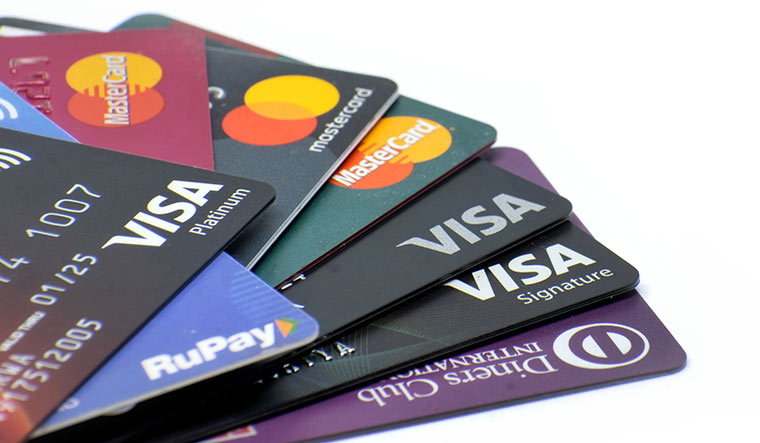

In [1]:
#@title Project
import requests
from IPython.display import Image, display
from IPython.display import HTML

# Direct image URL
image_url = "https://img.theweek.in/content/dam/week/magazine/theweek/business/images/2023/12/9/54-shutterstock.jpg"

# Download the image
response = requests.get(image_url)
with open('image.jpg', 'wb') as file:
    file.write(response.content)

import base64

# Convert the image to a base64 string
with open("image.jpg", "rb") as image_file:
    encoded_string = base64.b64encode(image_file.read()).decode()

# Create the HTML code with the base64 image
html_code = f"""
<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Portfolio Header</title>
    <!-- Include Font Awesome -->
    <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/font-awesome/6.0.0-beta3/css/all.min.css">
    <style>
        body {{
            font-family: Arial, sans-serif;
            margin: 0;
            padding: 0;
        }}
        .header {{
            display: flex;
            align-items: flex-start; /* Align items to the top */
            /*align-items: center;*/
            padding: 20px;
            background-color: #080a09;
            border-bottom: 2px solid #ccc;
        }}
        .header img {{
            border-radius: 50%;
            width: 100px;
            height: 100px;
            object-fit: cover;
            margin-right: 20px;
            box-shadow: 0 0 20px #076e2c; /* Glowing effect */
            vertical-align: top;
        }}
        .header .text-container {{
            display: flex;
            flex-direction: column;
        }}
        .header h1 {{
            margin: 0;
            font-size: 2em;
        }}
        .header p {{
            margin: 5px 0 0 0;
            font-size: 1em;
            color: #666;
        }}
        .header .social-icons {{
            margin-top: 10px;
        }}
        .header .social-icons a {{
            margin-right: 10px;
            color: #666;
            text-decoration: none;
            font-size: 1.5em;
        }}
        .header .social-icons a:hover {{
            color: #000;
        }}
    </style>
</head>
<body>
    <header class="header">
        <img src="data:image/jpeg;base64,{encoded_string}" alt="Profile Picture">
        <div class="text-container">


            <h1>Credit card approval analysis and prediction</h1>
            <p></p>
            <p>#machine_learning #analysis #prediction </p>
            &nbsp;
            <p>Imran Abu Libda</p>

            <div class="social-icons">





                <a href="https://www.linkedin.com/in/imran-abu-libda/" target="_blank"><i class="fab fa-linkedin"></i></a>
                <a href="mailto:imranabulibda@gmail.com"><i class="fas fa-envelope"></i>
                <a href="https://github.com/3m0r9" target="_blank"><i class="fab fa-github"></i></a>


            </div>
        </div>
    </header>
</body>
</html>
"""

# Display the HTML code in the Jupyter/Colab notebook
display(HTML(html_code))

In [4]:
# Import necessary libraries
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,roc_curve, auc

In [23]:
!kaggle datasets download -d rikdifos/credit-card-approval-prediction

Dataset URL: https://www.kaggle.com/datasets/rikdifos/credit-card-approval-prediction
License(s): CC0-1.0
credit-card-approval-prediction.zip: Skipping, found more recently modified local copy (use --force to force download)


In [24]:
# !unzip /content/credit-card-approval-prediction.zip

In [25]:
# Load datasets
app_record = pd.read_csv('/content/application_record.csv')
credit_record = pd.read_csv('/content/credit_record.csv')

In [26]:
app_record.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


In [27]:
print(credit_record.head())

        ID  MONTHS_BALANCE STATUS
0  5001711               0      X
1  5001711              -1      0
2  5001711              -2      0
3  5001711              -3      0
4  5001712               0      C


In [2]:
# Creating subplots for distributions of various features
fig = make_subplots(
    rows=3, cols=3,
    subplot_titles=('Gender', 'Income', 'Education Level', 'Family Status', 'Housing Type', 'Age', 'Years Employed')
)

# Gender Distribution
gender_fig = px.histogram(app_record, x='CODE_GENDER', color='CODE_GENDER', title='Gender Distribution',
                          color_discrete_sequence=px.colors.qualitative.Pastel, template='plotly_dark').data[0]
fig.add_trace(gender_fig, row=1, col=1)

# Income Distribution
income_fig = px.histogram(app_record, x='AMT_INCOME_TOTAL', nbins=50, title='Income Distribution',
                          color_discrete_sequence=['#00CC96'], template='plotly_dark').data[0]
fig.add_trace(income_fig, row=1, col=2)

# Education Level Distribution
education_fig = px.histogram(app_record, x='NAME_EDUCATION_TYPE', title='Education Level Distribution',
                             color='NAME_EDUCATION_TYPE', color_discrete_sequence=px.colors.qualitative.Set2, template='plotly_dark').data[0]
fig.add_trace(education_fig, row=1, col=3)

# Family Status Distribution
family_fig = px.histogram(app_record, x='NAME_FAMILY_STATUS', title='Family Status Distribution',
                          color='NAME_FAMILY_STATUS', color_discrete_sequence=px.colors.qualitative.Vivid, template='plotly_dark').data[0]
fig.add_trace(family_fig, row=2, col=1)

# Housing Type Distribution
housing_fig = px.histogram(app_record, x='NAME_HOUSING_TYPE', title='Housing Type Distribution',
                           color='NAME_HOUSING_TYPE', color_discrete_sequence=px.colors.qualitative.Alphabet, template='plotly_dark').data[0]
fig.add_trace(housing_fig, row=2, col=2)

# Age Distribution
app_record['AGE'] = app_record['DAYS_BIRTH'] // -365
age_fig = px.histogram(app_record, x='AGE', nbins=50, title='Age Distribution',
                       color_discrete_sequence=['#FFA15A'], template='plotly_dark').data[0]
fig.add_trace(age_fig, row=2, col=3)

# Years Employed Distribution
app_record['YEARS_EMPLOYED'] = app_record['DAYS_EMPLOYED'] // -365
employed_fig = px.histogram(app_record, x='YEARS_EMPLOYED', nbins=50, title='Years Employed Distribution',
                            color_discrete_sequence=['#AB63FA'], template='plotly_dark').data[0]
fig.add_trace(employed_fig, row=3, col=1)

fig.update_layout(height=900, width=900, title_text='Distributions of Various Features', title_font_size=24, title_x=0.5)
fig.show()

NameError: name 'make_subplots' is not defined

In [29]:
# income vs. age colored by gender
scatter_fig = px.scatter(app_record, x='AGE', y='AMT_INCOME_TOTAL', color='CODE_GENDER',
                         title='Income vs. Age by Gender', color_discrete_sequence=px.colors.qualitative.Pastel, template='plotly_dark')
scatter_fig.update_layout(title_font_size=20, title_x=0.5, xaxis_title='Age', yaxis_title='Income')
scatter_fig.show()

In [30]:
# Income by family status
box_fig = px.box(app_record, x='NAME_FAMILY_STATUS', y='AMT_INCOME_TOTAL', color='NAME_FAMILY_STATUS',
                 title='Income by Family Status', color_discrete_sequence=px.colors.qualitative.Vivid, template='plotly_dark')
box_fig.update_layout(title_font_size=20, title_x=0.5, xaxis_title='Family Status', yaxis_title='Income')
box_fig.show()

In [31]:
# Heatmap of correlation matrix
numberical_cols = app_record.select_dtypes(include=[np.number]).columns

correlation_matrix = app_record[numberical_cols].corr()

heatmap_fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='Viridis',
    colorbar=dict(title='Correlation'),
    zmin=-1,zmax=1, # Setting color scale range
    showscale=True  # Display color scale
))
# Add annotations to the heatmap
annotations=[]
for i, row in enumerate(correlation_matrix.values):
  for j, value in enumerate(row):
    annotations.append(
        dict(text=str(round(value,2)),
        x=correlation_matrix.columns[j],
        y=correlation_matrix.columns[i],
        xref='x1', yref='y1',
        font=dict(color='black', size=12),
        showarrow=False
     )
    )

heatmap_fig.update_layout(
    title='Correlation Matrix',
    xaxis_nticks=36,
    template='plotly_dark',
    annotations=annotations # Add annotations to the layout
)

heatmap_fig.show()

In [32]:
# Preprocessing
# Merge datasets on ID
df = pd.merge(app_record,credit_record,on='ID')

In [33]:
# Create a new column to classify clients as 'good' or 'bad' based on STATUS
def classify_client(status):
  if status in ['2','3','4','5']:
    return 'bad'
  else:
    return 'good'

df['client_status'] = df['STATUS'].apply(classify_client)

In [34]:
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,YEARS_EMPLOYED,MONTHS_BALANCE,STATUS,client_status
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,0,0,NaN,2.0,32,12,0,C,good
1,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,0,0,NaN,2.0,32,12,-1,C,good
2,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,0,0,NaN,2.0,32,12,-2,C,good
3,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,0,0,NaN,2.0,32,12,-3,C,good
4,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,0,0,NaN,2.0,32,12,-4,C,good


In [35]:
# Label encoding for the target variable
label_encoder = LabelEncoder()
df['client_status'] = label_encoder.fit_transform(df['client_status'])

In [36]:
# Drop columns that won't be used
df.drop(columns=['ID','STATUS','MONTHS_BALANCE'],inplace=True)

In [37]:
# Encode categorical variables
categorical_cols = df.select_dtypes(include=['object']).columns
df=pd.get_dummies(df, columns=categorical_cols, drop_first=True)

In [38]:
# Handle missing values
df.fillna(df.median(),inplace=True)

In [39]:
# Split data into features and target variable
x=df.drop(columns=['client_status'])
y=df['client_status']

In [40]:
y.value_counts()

,count
client_status,
1,774887
0,2828


In [41]:
# Handle imbalanced data using SMOTE
smote = SMOTE()
x_resampled, y_resampled = smote.fit_resample(x,y)

In [42]:
# Standardize features
scaler = StandardScaler()
x_resampled = scaler.fit_transform(x_resampled)

In [43]:
# Split data into training and testing sets
x_train,x_test,y_train,y_test = train_test_split(x_resampled,y_resampled,test_size=0.2,random_state=42)

In [44]:
# Logistic Regression
log_reg= LogisticRegression()
log_reg.fit(x_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [45]:
y_pred_log =log_reg.predict(x_test)
accuracy_log = accuracy_score(y_test,y_pred_log)
accuracy_log

0.646761626687745

In [46]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

RandomForestClassifier()

In [47]:
y_pred_rf = rf.predict(x_test)
accuracy_rf= accuracy_score(y_test,y_pred_rf)
accuracy_rf

0.9822103208530271

In [48]:
# classification reports of RandomForestClassifier
print(classification_report(y_test,y_pred_rf))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98    155425
           1       1.00      0.97      0.98    154530

    accuracy                           0.98    309955
   macro avg       0.98      0.98      0.98    309955
weighted avg       0.98      0.98      0.98    309955



In [49]:
# ROC Curve
fpr, tpr, _ = roc_curve(y_test,rf.predict_proba(x_test)[:,1])
roc_auc = auc(fpr,tpr)

# Display ROC Curve
fig=go.Figure()
fig.add_trace(go.Scatter(x=fpr,y=tpr,mode='lines',name='RandomForest_classifier_model',line=dict(color='firebrick',width=2)))
fig.update_layout(title='ROC Curve', xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',template='plotly_dark',title_font_size=20,title_x=0.5)
fig.show()

In [50]:
# Calculate confusion matrix
confusion_matrix= confusion_matrix(y_test,y_pred_rf)

labels=['True Negative','False Positive','False Negative','True Positive']

# Create an annotated heatmap
fig = ff.create_annotated_heatmap(confusion_matrix, x=['Predicted'+ label for label in ['0','1']],
                                  y=['Actual'+ label for label in ['0','1']],
                                  colorscale='Viridis')

fig.update_layout(title_text='Confusion Matrix',
                  xaxis=dict(title='Predicted label'),
                  yaxis=dict(title='True label'))

fig.show()